# Create or manipulate images with the DALL-E API
<img src="../media/dalle2.png" alt="drawing" style="width:1200px;"/>

The following options are available to get access to the DALL-E 2 API:

- Subscribe to the [original OpenAI service](https://openai.com/join/) 
- Request access to the [Azure OpenAI preview](https://aka.ms/oaiapply) - express interest for DALL-E, however consider the __limited availability at the moment__   

Instead of the API, you can use the [DALL-E playground](https://labs.openai.com/) for an interactive experience.

The Images API provides three methods for interacting with images:

1. Creating images from scratch based on a text prompt
2. Creating variations of an existing image
3. Creating edits of an existing image based on a new text prompt

Check out the [OpenAI API documentation](https://beta.openai.com/docs/guides/images) for more information. 

In [1]:
import sys
sys.path.insert(0, '..')

import os
import time
import openai
from PIL import Image
import requests
import math
from io import BytesIO
import matplotlib.pyplot as plt
from dotenv import load_dotenv

from utils import show_images

In [2]:
load_dotenv('../.env')

# Original OpenAI DALLE API
openai.api_key = os.getenv('OPENAI_API_KEY')

# Azure OpenAI DALLE
api_key = os.getenv('AOAI_API_KEY') # key of your Azure OpenAI resource
api_base = os.getenv('AOAI_ENDPOINT') # endpoint of your Azure OpenAI resource
api_version = '2022-08-03-preview' # recommended to check for updates

# Create images from prompt
The image generations endpoint allows you to create an image given a text prompt. The more detailed the description, the more likely you are to get the result that you or your end user want.

<img src="../media/prompt-design.png" alt="prompt design" style="width:1200px;"/>

Source: [DALL-E 2 Prompt Book](https://dallery.gallery/the-dalle-2-prompt-book/)  

Each image can be returned as either a URL or Base64 data, using the response_format parameter. URLs will expire after an hour.

In [3]:
openai_response = openai.Image.create(
  prompt= "A 3D render of a rainbow colored hot air balloon flying above a reflective lake",
  n= 6,
  size= "1024x1024",
  response_format = 'url', # url or b64_json 
  user = '', # represents end user for creating multiuser apps
)

images = [image['url'] for image in openai_response['data']]

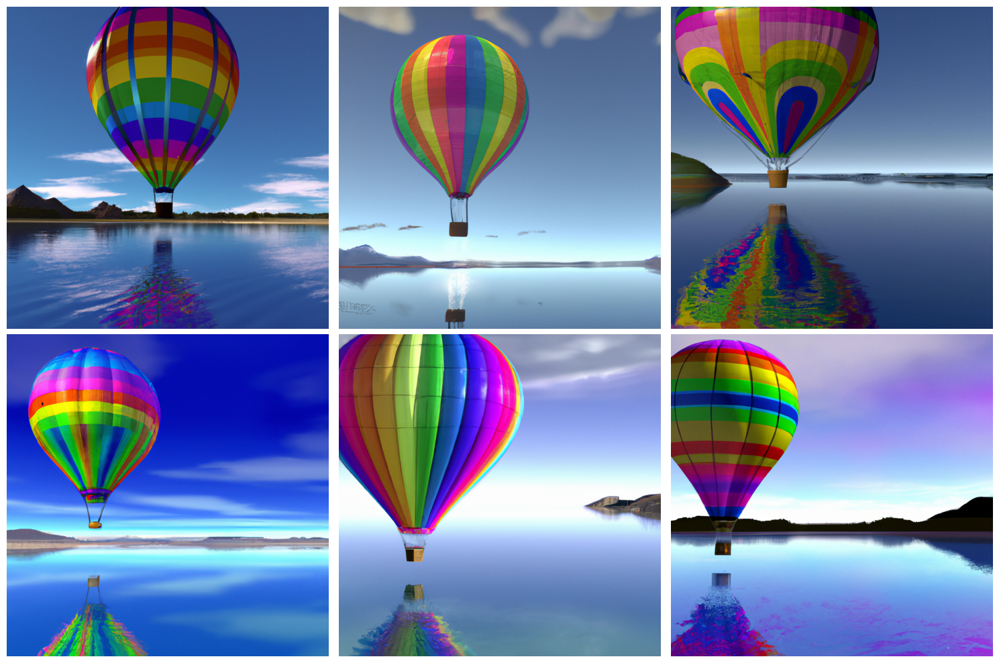

In [4]:
show_images(images, cols=3, savedir='./results/running-shoe/')

## Content Moderation
Prompts and images are filtered based on OpenAI's content policy, returning an error when a prompt or image is flagged. The following examples show that generating images of a politician fails while it is possible to create images of celebrities like rock stars.

In [9]:
try:
    openai_response = openai.Image.create(
    prompt="A portrait of Barack Obama", # this will fail
    n=1,
    size="1024x1024",
    response_format = 'url', 
    user = '', # represent end user for creating multiuser apps
    )
except openai.error.OpenAIError as e:
  print(e.http_status)
  print(e.error)

400
{
  "code": null,
  "message": "Your request was rejected as a result of our safety system. Your prompt may contain text that is not allowed by our safety system.",
  "param": null,
  "type": "invalid_request_error"
}


In [10]:
try:
    openai_response = openai.Image.create(
    prompt="A photo of Mick Jagger, photorealistic, high quality, 8k", # this works
    n=6,
    size="1024x1024",
    response_format = 'url', 
    user = '', # represent end user for creating multiuser apps
    )
except openai.error.OpenAIError as e:
  print(e.http_status)
  print(e.error)

images = [image['url'] for image in openai_response['data']]

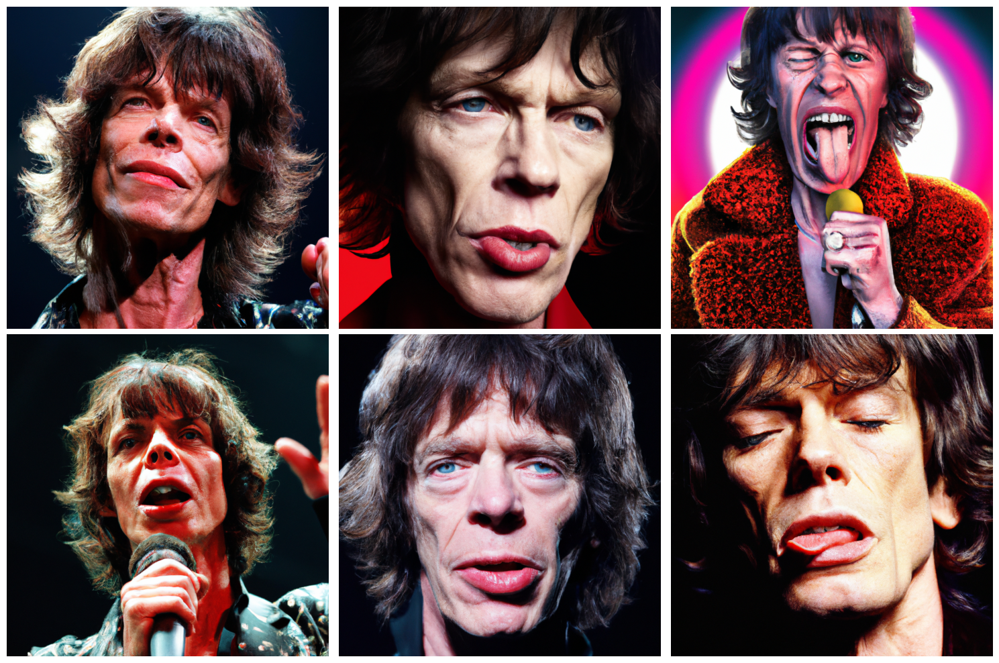

In [11]:
show_images(images, cols=3, savedir='./results/Jagger/')

# savedir = './results/marilyn/'

# png_filenames = [os.path.join(savedir, image) for image in os.listdir(savedir) if image.endswith('.png')]
# show_images(png_filenames, source='local')

# Create variations of an existing image
The image variations endpoint allows you to generate a variation of a given image. Input image needs to be `.png` format with squared dimensions and a max file size size of 4 MB.
## General Sample

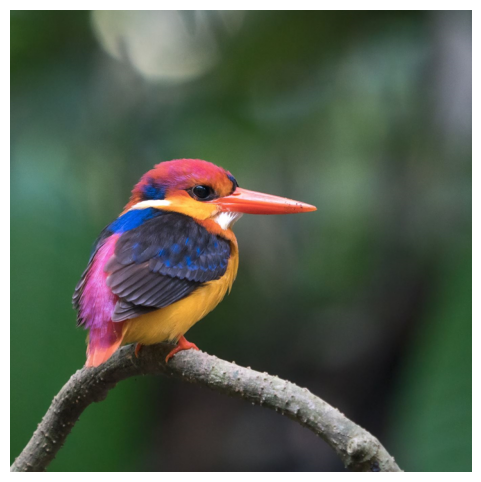

In [5]:
source_img = './source/bird.png' # existing image

plt.figure(figsize=(6,6))

img = Image.open(source_img)
plt.imshow(img)
plt.axis('off')

plt.show()

In [6]:
response = openai.Image.create_variation(
  image=open(source_img, "rb"),
  n=6,
  size="1024x1024"
)

images = [image['url'] for image in response['data']]

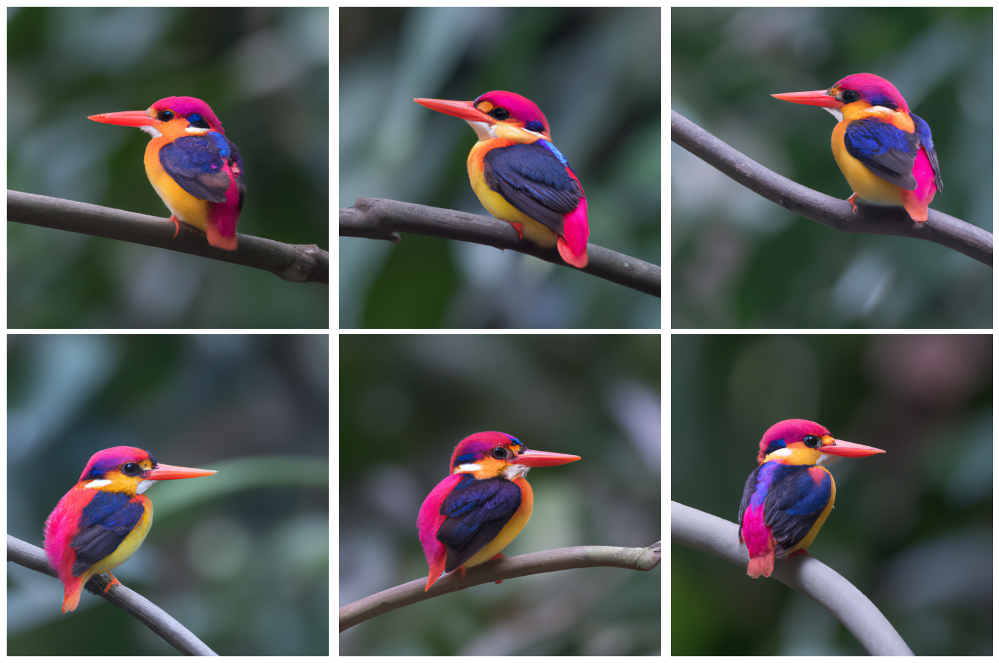

In [7]:
show_images(images, cols = 3, savedir='./results/bird/')

## Person

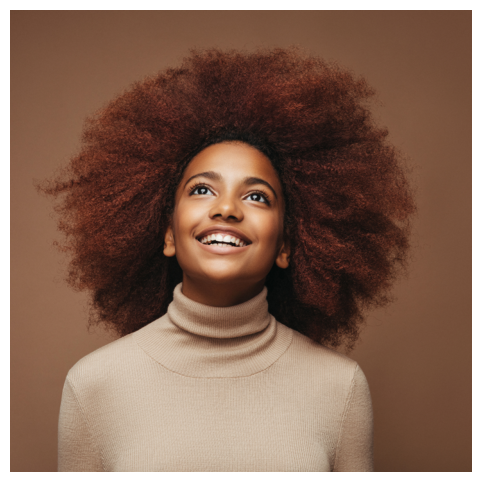

In [15]:
plt.figure(figsize=(6,6))

source_img = './source/smile.png'

img = Image.open(source_img)
plt.imshow(img)
plt.axis('off')

plt.show()

In [16]:
response = openai.Image.create_variation(
  image=open(source_img, "rb"),
  n=6,
  size="1024x1024"
)

images = [image['url'] for image in response['data']]

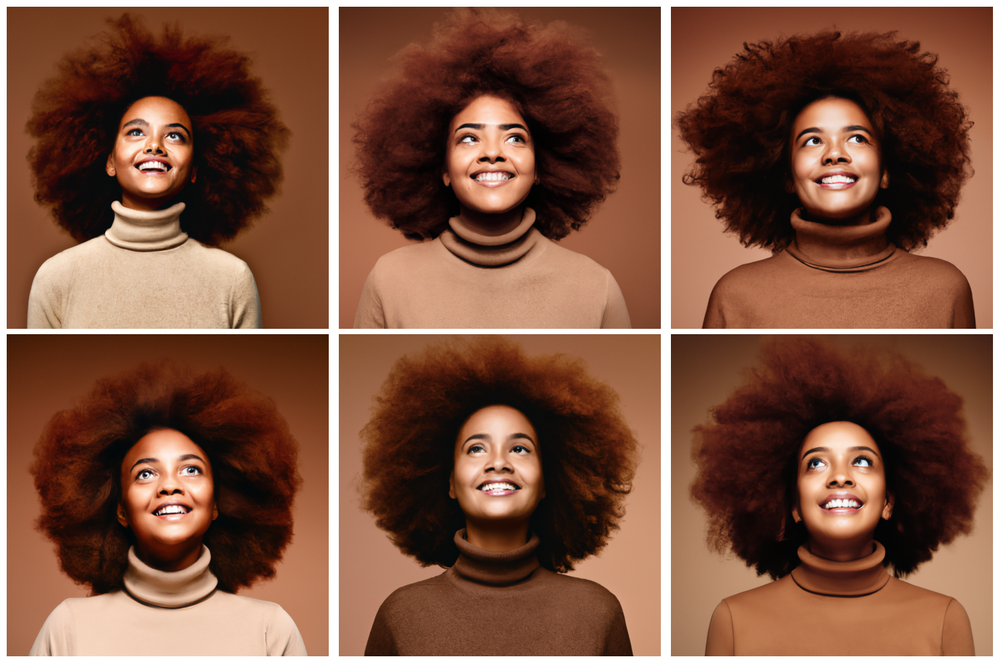

In [17]:
# png_filenames = [os.path.join(savedir, image) for image in os.listdir(savedir) if image.endswith('.png')]
show_images(images, cols=3, savedir = './results/smile/')

# Replace objects in an image
The image edits endpoint allows you to edit and extend an image by uploading a mask. The transparent areas of the mask indicate where the image should be edited, and the prompt should describe the full new image, not just the erased area.
Image and mask files need to be `.png` format, less than 4 MB size and have squared dimensions.

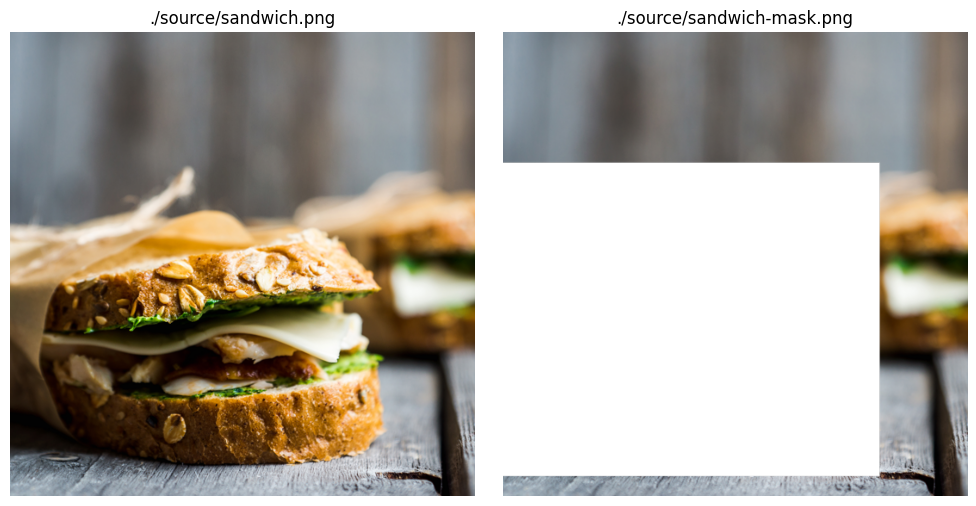

In [8]:
source_image = './source/sandwich.png'
mask_image = './source/sandwich-mask.png'

show_images([source_image, mask_image], source='local', show_title=True)

In [9]:
response = openai.Image.create_edit(
  image=open(source_image, "rb"),
  mask=open(mask_image, "rb"),
  prompt="photo of a hamburger on wood",
  n=6,
  size="1024x1024"
)
images = [image['url'] for image in response['data']]

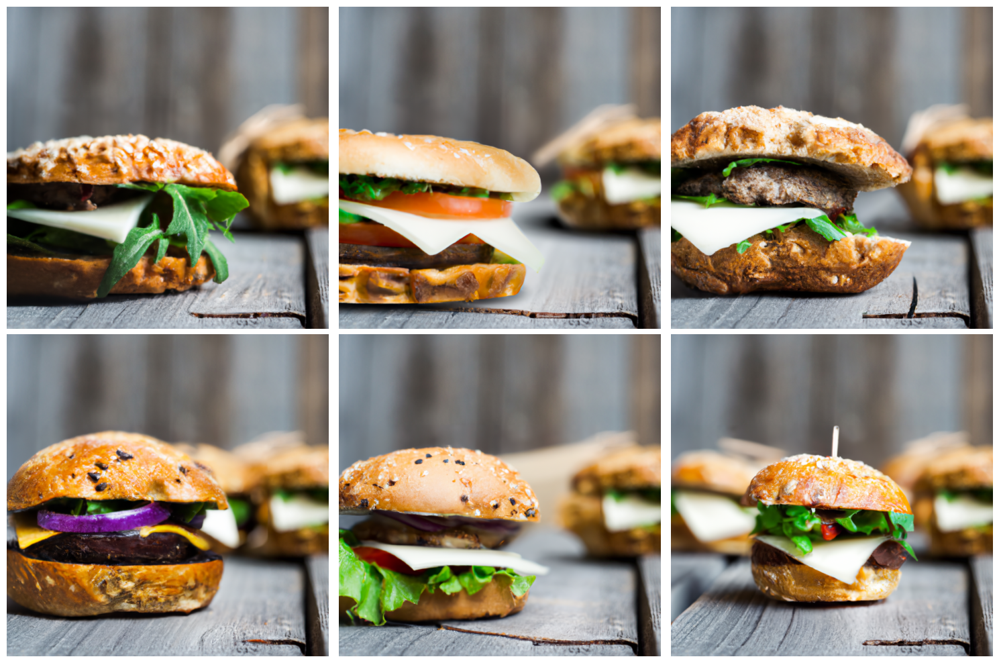

In [10]:
show_images(images, cols=3, savedir='./results/food/')

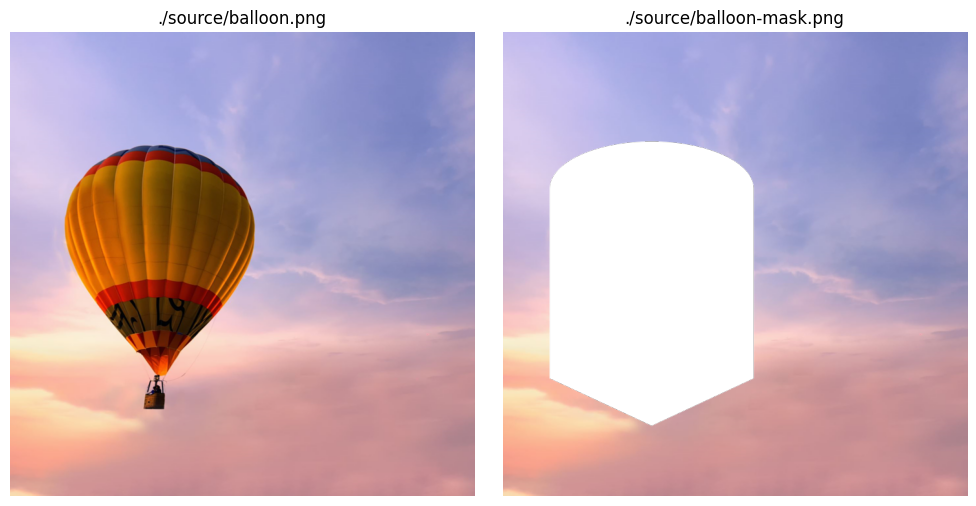

In [11]:
source_image = './source/balloon.png'
mask_image = './source/balloon-mask.png'

show_images([source_image, mask_image], source='local', show_title=True)

In [12]:
response = openai.Image.create_edit(
  image=open(source_image, "rb"),
  mask=open(mask_image, "rb"),
  prompt="photo of a games of thrones dragon flying in the sky, high quality, very detailed",
  n=6,
  size="1024x1024"
)
images = [image['url'] for image in response['data']]

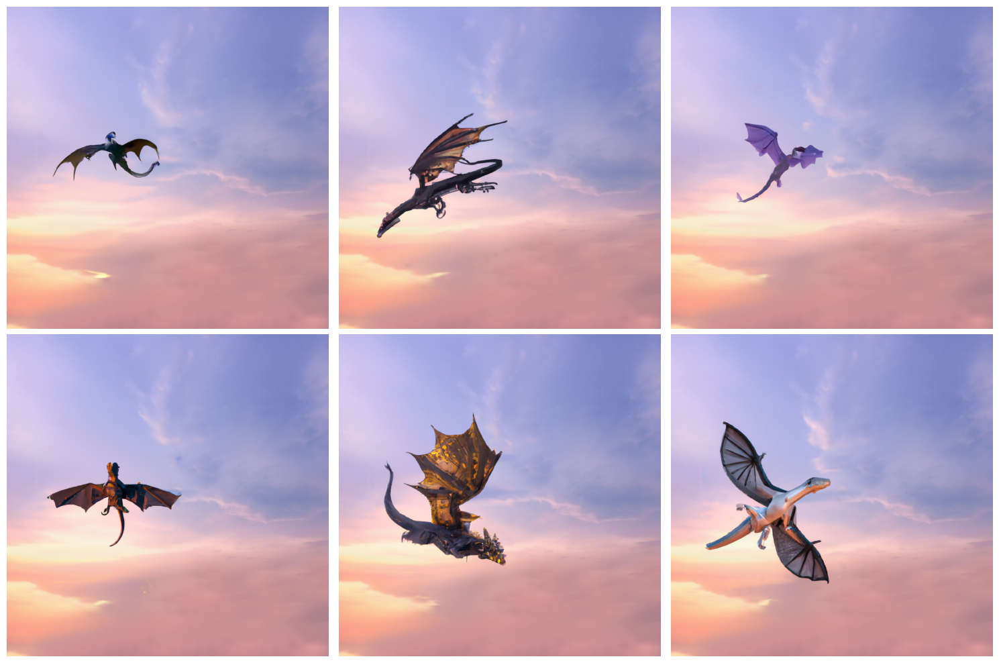

In [13]:
show_images(images, cols=3, savedir='./results/sky/')